# Neural Embeddings

Dataset: [Indonesian - English ind-eng.zip (13570)](https://www.manythings.org/anki/ind-eng.zip)

## 1. Import libraries

In [33]:
import tensorflow as tf
import re
import numpy as np
from sklearn.model_selection import train_test_split

## 2. Data Preparation

- sentences cleaning
- converting each words into Lowercase
- using stopwords to remove unnecessary words
- using regex to remove unusual pattern such as "https://..." and etc.

In [34]:
def preprocess_sentence(sentence: str) -> str:
    # 1. lowercase + deleting space in start and end
    sentence = sentence.lower().strip()

    # 2. replacing punctuation with space " "
    sentence = re.sub(r"([?.!,¿])", r" \1 ", sentence)

    # 3. replacing space that're more than 1 with 1 space only " "
    sentence = re.sub(r'[" "]+', " ", sentence)

    # 4. replacing non-numerical character with space
    sentence = re.sub(r'[^a-zA-Z?.!,]+', " ", sentence)

    # 5. Making sure no space left on the beginning and ending of sentence
    sentence = sentence.strip()

    # 6. Adding <start> and <end> token
    sentence = '<start> ' + sentence + ' <end>'

    # 7. return
    return sentence

In [35]:
def load_dataset(path, num_examples = None):
  # 1. Open file
  with open(path, 'r', encoding='utf-8') as f:
    lines = f.read().strip().split('\n')

  # 2. Adding tabs for each sentences
  parts = [line.split('\t') for line in lines[:num_examples]]

  # 3. Preprocessing each sentences
  sentences = [preprocess_sentence(part[0]) for part in parts]
  labels = [part[1] for part in parts]

  return sentences, labels

input_data, target_data = load_dataset("../data/ind.txt", num_examples = 10000)
print("Input data: ", input_data)
print("Target data: ", target_data)

Input data:  ['<start> hi . <end>', '<start> run ! <end>', '<start> run . <end>', '<start> who ? <end>', '<start> wow ! <end>', '<start> wow ! <end>', '<start> fire ! <end>', '<start> fire ! <end>', '<start> fire ! <end>', '<start> help ! <end>', '<start> jump ! <end>', '<start> jump . <end>', '<start> stop ! <end>', '<start> wait ! <end>', '<start> wait . <end>', '<start> hello . <end>', '<start> hurry ! <end>', '<start> hurry ! <end>', '<start> hurry ! <end>', '<start> i see . <end>', '<start> i see . <end>', '<start> i see . <end>', '<start> i see . <end>', '<start> i see . <end>', '<start> i see . <end>', '<start> i won ! <end>', '<start> i won . <end>', '<start> oh no ! <end>', '<start> relax . <end>', '<start> relax . <end>', '<start> shoot ! <end>', '<start> smile . <end>', '<start> attack ! <end>', '<start> cheers ! <end>', '<start> freeze ! <end>', '<start> get up . <end>', '<start> got it ! <end>', '<start> got it ? <end>', '<start> he ran . <end>', '<start> i know . <end>', 

## 3. Data encoding (tokenizer, etc.)

In [36]:
# Tokenize input & target data
tokenizer = tf.keras.preprocessing.text.Tokenizer(filters='')
tokenizer.fit_on_texts(input_data + target_data)

# Convert sentences into sequences of integers to be processed by the Neural Networks
input_sequences = tokenizer.texts_to_sequences(input_data)
target_sequences = tokenizer.texts_to_sequences(target_data)

# Calculate max length of each sequences to create a padded sequences with the same length
max_input_length = max(len(seq) for seq in input_sequences)
max_target_length = max(len(seq) for seq in target_sequences)

# Pad sequences to ensure they have the same length
input_sequences = tf.keras.preprocessing.sequence.pad_sequences(input_sequences, maxlen=max_input_length, padding='post')
target_sequences = tf.keras.preprocessing.sequence.pad_sequences(target_sequences, maxlen=max_target_length, padding='post')

print("Input sequences: \n", input_sequences)
print("\nTarget sequences: \n", target_sequences)

Input sequences: 
 [[   1 1279    2 ...    0    0    0]
 [   1  766    2 ...    0    0    0]
 [   1  766    2 ...    0    0    0]
 ...
 [   1   37   33 ...    0    0    0]
 [   1   37    6 ...    0    0    0]
 [   1   37    6 ...    0    0    0]]

Target sequences: 
 [[1357    0    0 ...    0    0    0]
 [1674    0    0 ...    0    0    0]
 [1674    0    0 ...    0    0    0]
 ...
 [  50   32 2988 ...    0    0    0]
 [  43 1488 1488 ...    0    0    0]
 [  15  748 2372 ...    0    0    0]]


- Take the vocab_size for embedding layer input dimensions

In [37]:
vocab_size = len(tokenizer.word_index) + 1

## 4. Data Splitting (80:20)

In [38]:
X_train, X_test, y_train, y_test = train_test_split(input_sequences, target_sequences, test_size=0.2, random_state=42)

# 5. Dataset shuffling

- Intinya kita buat dataset custom yg isinya itu training data kita yg di shuffle sebanyak BUFFER_SIZE
- kita juga ngeset BATCH Training kita dari sekarang yg otomatis akan ngebagi dataset dari sekarang
- ngedrop sisanya klo udah lewat dari BATCH_SIZE yg dah ditentuin

**Notes: semakin besar BUFFER_SIZE, semakin bagus randomizer datanya.**

In [39]:
BUFFER_SIZE = len(X_train)
BATCH_SIZE = 64

train_dataset = tf.data.Dataset.from_tensor_slices((X_train, y_train))
train_dataset = train_dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE, drop_remainder=True)

test_dataset = tf.data.Dataset.from_tensor_slices((X_test, y_test))
test_dataset = test_dataset.batch(BATCH_SIZE, drop_remainder=True)

## 6. Encoder making

Buat setiap kata yang bentuknya sudah menjadi seperti ini:
```yaml
[  1  49   3   2   0   0   0   0]
```
akan diubah menjadi sebuah vektor representasi dari kata-kata tersebut dengan menggunakan **`Embedding Layer`**.
Kemudian kita akan mengambil **Summary** dari sentences tersebut menggunakan layer `LSTM (Long-Short-Term Memory)` atau `GRU (Gated--Recurrent Unit)` yang akan menghasilkan dua buah output yaitu **Summary (Hidden State)** + **Detailed Results (Output State)**.

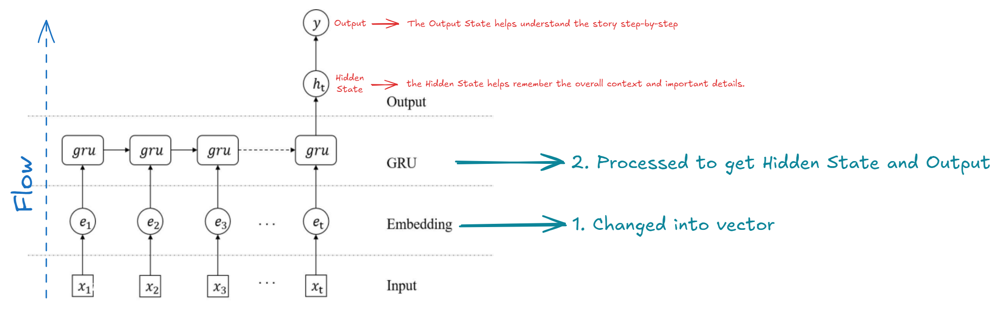

**Conclusions: Input sequence is processed by an encoder, which produces a set of hidden states, one for each input token.**

In [40]:
class Encoder(tf.keras.Model):
  # 1. constructor (super() + attributes initializations)
  def __init__(self, vocab_size, embedding_dim, enc_units, batch_size):
    # 1.1. Inheritance dari parent class tf.keras.Model
    super(Encoder, self).__init__()
    # 1.2. Attribute initializations
    self.batch_size = batch_size # banyaknya batch yg akan dijalankan per epochnya.
    self.enc_units = enc_units # banyaknya unit/neuron untuk GRU layer.
    self.embedding = tf.keras.layers.Embedding(input_dim=vocab_size, output_dim=embedding_dim) # embedding layer
    self.gru = tf.keras.layers.GRU(units=self.enc_units, return_sequences=True, return_state=True, recurrent_initializer='glorot_uniform') # gru layer
    '''
    notes untuk GRU layer:
      - units = banyaknya Neuron dalam layer GRU
      - (return_sequences=True) = True berarti dia akan mengembalikan output state
      - (return_state=True) = True berarti dia akan mengembalikan hidden state
    '''

  # 2. call(): runs the flows (pad_sequences -> Embedding() -> GRU() -> Output, HiddenState)
  def call(self, vector_input, hidden_state):
    vector_input = self.embedding(vector_input)
    output, state = self.gru(vector_input, initial_state=hidden_state)
    return output, state

  # 3. Initializing empty hidden states (blank canvas/paper)
  def initialize_hidden_state(self):
    return tf.zeros((self.batch_size, self.enc_units))

## Examples
- putting 64 Pad_sequences of X_train data into the encoder

In [41]:
# 1. Initialize the object
encoder = Encoder(vocab_size, embedding_dim = 256, enc_units = 1024, batch_size = 64)

# 2. Call the object methods (encoder.initialize_hidden_state())
hidden = encoder.initialize_hidden_state()

# 3. Put the X_train into the encoder
example_input_batch = X_train[:64]
output, hidden_state = encoder(example_input_batch, hidden)
'''
Notes:
- The encoder will return two things just like we expected which's output & hidden_state
'''

print("Output shape: ", output.shape)
print("Hidden state shape: ", hidden_state.shape)

Output shape:  (64, 12, 1024)
Hidden state shape:  (64, 1024)


- Output Vector: Full Detail of the text contexts

ex.) First vector of the whole vector (1 vector = 1 sentences)

In [42]:
output[:1]

<tf.Tensor: shape=(1, 12, 1024), dtype=float32, numpy=
array([[[ 0.00132472,  0.00182114,  0.00122825, ..., -0.0008211 ,
          0.00727149,  0.00012732],
        [-0.00514197,  0.00089482,  0.00460689, ...,  0.00656353,
          0.00797319, -0.00229574],
        [-0.001275  ,  0.00155897,  0.00352363, ...,  0.00134764,
          0.00913576,  0.00557301],
        ...,
        [ 0.00377176, -0.01536465,  0.00520392, ...,  0.00151861,
          0.00614721,  0.01295334],
        [ 0.00343405, -0.01835173,  0.00441908, ...,  0.00358617,
          0.00645397,  0.0174291 ],
        [ 0.00312318, -0.01992245,  0.00337236, ...,  0.00487236,
          0.00622372,  0.02011488]]], dtype=float32)>

- Hidden State: Summary and Important details of the whole text
ex.) First Hidden State

In [43]:
hidden_state[:1]

<tf.Tensor: shape=(1, 1024), dtype=float32, numpy=
array([[ 0.00312318, -0.01992245,  0.00337236, ...,  0.00487236,
         0.00622372,  0.02011488]], dtype=float32)>

- Notes:
  - Output is a vector 3d or 3 dimensional vector
  - Hidden_state is a vector 2d or 2 dimensional vector

> Thus, for processing purpose, we need to adjust the dimensions of the hidden_state so we can process it correctly using `tf.expand_dims(hidden_state,1)` -> this means we adding one more dimensions to the hidden_state.

This process will be done in the attention network.

# Attention Mechanism using Recurrent Neural Network

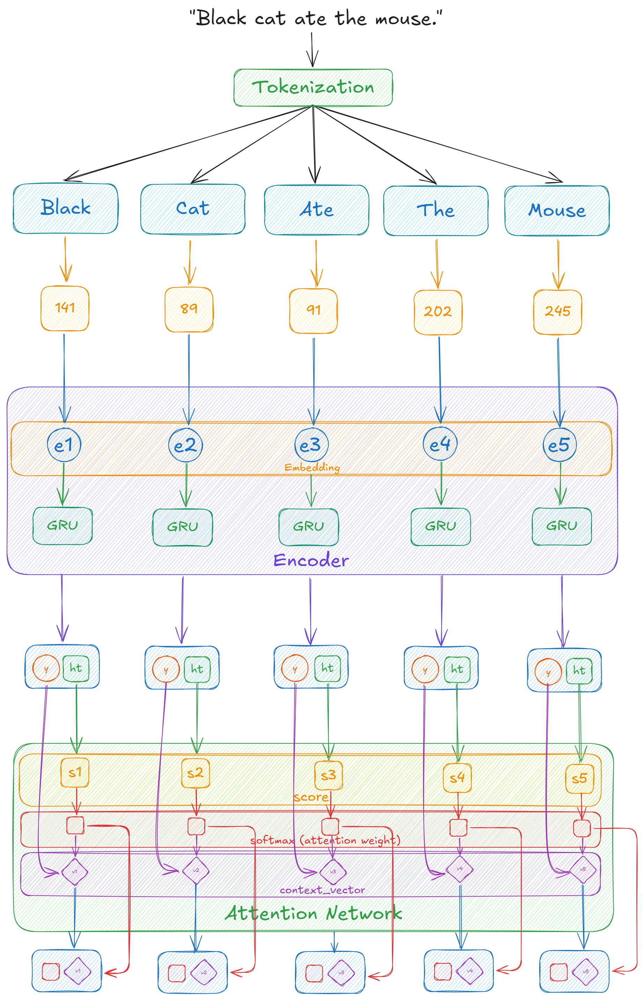

## 1. Attention Network Making

In [44]:
class AttentionNetwork(tf.keras.layers.Layer):
  # 1. constructor (super() + attributes initializations)
  def __init__(self, units):
    super(AttentionNetwork, self).__init__()
    # 1.1. First dense layer -> Processing hidden_state so it has the same dimensions
    self.W1 = tf.keras.layers.Dense(units)
    # 1.2. Second dense layer -> Processing vector so it has the same dimensions
    self.W2 = tf.keras.layers.Dense(units)
    # 1.3. Third dense layer -> Final processing resulting in a Scalar for one single score
    self.V = tf.keras.layers.Dense(1)

  # 2. call function: runs this flows: score() -> softmax() -> hidden_state multiplication
  def call(self, hidden_state, output):
    # 2.1. adding one more dimension for hidden_state
    query_with_time_axis = tf.expand_dims(hidden_state, 1)
    # 2.2. score processing: Read notes under this for detailed process
    score = self.V(tf.nn.tanh(self.W1(query_with_time_axis) + self.W2(output)))
    # 2.3. attention weight processing using softmax function
    attention_weights = tf.nn.softmax(score, axis=1)
    # 2.4. giving weights to output vector
    context_vector = attention_weights * output
    # 2.5. summarizing by summing all the values of the context vector in the first axis (vertical axis)
    context_vector = tf.reduce_sum(context_vector, axis=1)
    return context_vector, attention_weights

### Explanations:

1. Hidden state dimension adjustment

As what already explained, we need to adjust the dimensions of the hidden state to have the same dimensions as what we have in output.
```yaml
hidden_state = 2d
output = 3d

hidden_state 2d -> tf.expand_dims(hidden_state, 1) -> hidden_state 3d
```

2. Score calculation

Then, we calculate the score, by processing the hidden state and output vector into our dense layer.
```py
upper_hidden_state -> tf.keras.layers.Dense(units)
output -> tf.keras.layers.Dense(units)
```
This process will result in filtered hidden_state and output vector. Thus we combine both results `self.W1(query_with_time_axis) + self.W2(output)` and apply it to another activation function which's tanh()

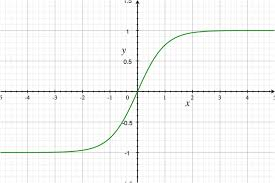

which only making a our results within range (-1, 1).

Then, we put the results into a dense layer that will act as an output layer with 1 unit only. Making the score calculation results as a **Scalar**.

3. Attention Weight based on score

Then, we use softmax function to get our attention weight base on our score.

ex.)

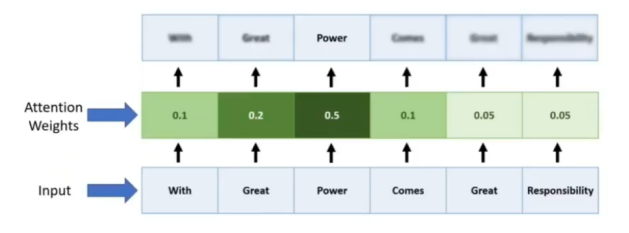

4. Context Vector
The attention weights **are used** to compute a context vector, which is **a weighted sum of the encoder hidden states.**

## Examples:

In [45]:
attention_layer = AttentionNetwork(10) # units-nya menyesuaikan
attention_result, attention_weights = attention_layer(hidden_state, output)

print("Attention result shape: ", attention_result.shape)
print("Attention weights shape: ", attention_weights.shape)

Attention result shape:  (64, 1024)
Attention weights shape:  (64, 12, 1)


- Attention result:

In [46]:
attention_result

<tf.Tensor: shape=(64, 1024), dtype=float32, numpy=
array([[ 0.00063516, -0.00331963,  0.00259657, ...,  0.00065426,
         0.00489602,  0.00439511],
       [ 0.0015    , -0.01183281,  0.00508873, ...,  0.00040133,
         0.00214986,  0.01006524],
       [ 0.00466438, -0.00829998, -0.00048013, ...,  0.0001932 ,
         0.00397848,  0.00979421],
       ...,
       [ 0.00216612, -0.00482362,  0.00507717, ..., -0.00488513,
         0.00063026,  0.00592507],
       [ 0.00383206, -0.00243262,  0.00158172, ..., -0.00308794,
         0.00648562,  0.0003484 ],
       [ 0.00321134, -0.00920851,  0.00401696, ..., -0.00077398,
         0.00637652,  0.00661261]], dtype=float32)>

- Attention Weights:

In [47]:
attention_weights[:1]

<tf.Tensor: shape=(1, 12, 1), dtype=float32, numpy=
array([[[0.0853543 ],
        [0.08317634],
        [0.08197493],
        [0.08235187],
        [0.08255252],
        [0.08240589],
        [0.08422821],
        [0.08556036],
        [0.0844462 ],
        [0.08334747],
        [0.08255512],
        [0.08204676]]], dtype=float32)>

## 2. Decoder Making

At each time step, the decoder calculates the attention score for each encoder hidden state. This is done by concatenating previous decoder hidden state with each encoder hidden state, passing through a feedforward neural network, and applying a softmax function to obtain attention weights

In [50]:
class Decoder(tf.keras.Model):
  def __init__(self, vocab_size, embedding_dim, dec_units, batch_size):
    super(Decoder, self).__init__()
    self.batch_size = batch_size
    self.dec_units = dec_units
    # Embedding layer for input
    self.embedding = tf.keras.layers.Embedding(input_dim=vocab_size, output_dim=embedding_dim)
    # GRU layer for hidden_state & output retrieval
    self.gru = tf.keras.layers.GRU(units=self.dec_units, return_sequences=True, return_state=True, recurrent_initializer='glorot_uniform')
    # Fully connected layer for connecting previous layer to decoder layer
    self.fc = tf.keras.layers.Dense(units=vocab_size)
    # Attention layer for weighting
    self.attention = AttentionNetwork(units=dec_units)

  def call(self, x, hidden, enc_output):
    # step 1: get vector_context & attention_weights from previous encoder hidden state and output
    vector_context, attention_weights = self.attention(hidden, enc_output)
    # step 2: embedding layer for change training_data into vector representation of words
    x = self.embedding(x)
    # step 3: concat training_data vector's with vector_context (beware of dimensions differences)
    x = tf.concat([tf.expand_dims(vector_context, 1)], axis=-1)
    # step 4: getting new output and hidden_state with the current training_data
    output, state = self.gru(x)
    # step 5: reshaping for fitting the results into a fully connected layer
    output = tf.reshape(output, (-1, output.shape[2]))
    x = self.fc(output)
    # step 6: x=results, state=hidden_state/summary, attention_weights=weighting
    return x, state, attention_weights

## Examples:

In [51]:
decoder = Decoder(vocab_size, embedding_dim = 256, dec_units = 1024, batch_size = 64)
sample_decoder_output, _, _ = decoder(tf.random.uniform((64, 1)), hidden_state, output)
print(f'Decoder Output Shape: (Batch_size), (Output_size) {sample_decoder_output.shape}')

Decoder Output Shape: (Batch_size), (Output_size) (64, 7637)


# Overview:

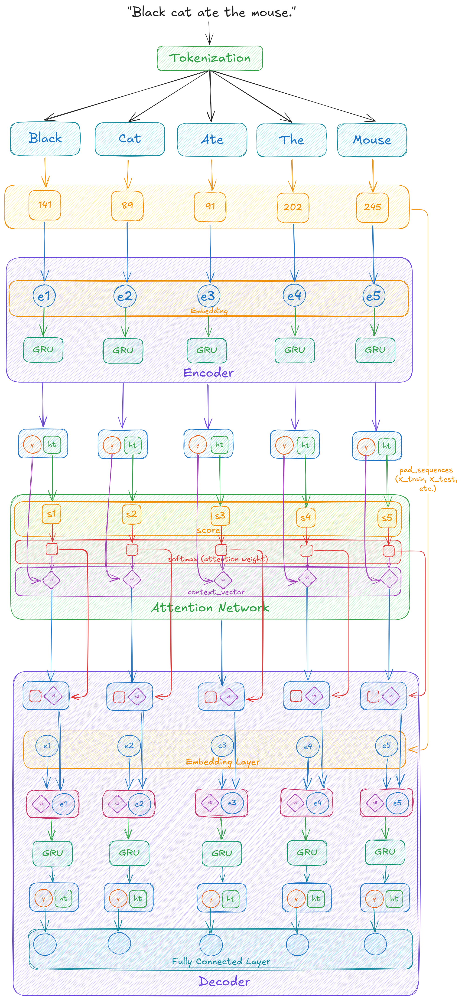

## 3. Model Making

In [52]:
import os

optimizer = tf.keras.optimizers.Adam()

loss_object = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True, reduction='none')
# from_logits=menunjukkan kalau data loss yg dihitung belum melewati softmax
# reduction=memperoleh loss untuk setiap sample secara terpisah

def loss_function(real, pred):
  # 1. mendapatkan nilai real yang bukan 0
  mask = tf.math.logical_not(tf.math.equal(real, 0))

  # 2. menghitung loss dan real menggunakan object loss yang sudah kita buat
  loss = loss_object(real, pred)

  # 3. mengubah data-type dari mask agar sama dengan data-type dari mask
  mask = tf.cast(mask, dtype=loss.dtype)

  # 4. mengalikan loss dengan mask untuk mengabaikan nilai real yang 0
  loss = loss * mask

  # 5. return nilai rata-rata dari loss
  return tf.reduce_mean(loss)

# Checkpoint
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, 'ckpt')
checkpoint = tf.train.Checkpoint(optimizer=optimizer, encoder=encoder, decoder=decoder)

## 4. Model Training Optimalizations

- Membuat train_step untuk menghitung batch loss

In [63]:
steps_per_epoch = len(X_train) // BATCH_SIZE

# split tokenized input and target data
inp_lang = tf.keras.preprocessing.text.Tokenizer(filters='')
inp_lang.fit_on_texts(input_data)

targ_lang = tf.keras.preprocessing.text.Tokenizer(filters='')
targ_lang.fit_on_texts(target_data)

special_token = ['<start>', '<end>']

for token in special_token:
    if token not in inp_lang.word_index:
        inp_lang.word_index[token] = len(inp_lang.word_index) + 1
    if token not in targ_lang.word_index:
        targ_lang.word_index[token] = len(targ_lang.word_index) + 1

In [66]:
@tf.function

def train_step(input, target, enc_hidden):
  # 1. inisialisasi loss (ini yang bakal kita hitung)
  loss = 0

  with tf.GradientTape() as tape:
    # 1. memasukkan data ke dalam encoder
    enc_output, enc_hidden = encoder(input, enc_hidden)

    # 2. mengatur decoder.hidden state agar sama dengan hidden state terakhir dari encoder
    dec_hidden = enc_hidden

    # 3. menyiapkan input pertama untuk decoder
    # menambahkan dimensi input berdasarkan setiap sequences yang diawali dengan <start> sebanyak BATCH_SIZE
    dec_input = tf.expand_dims([targ_lang.word_index['<start>']] * BATCH_SIZE, 1)

    # 4. loop untuk setiap kata dalam target (target.shape[1] = panjang kalimat)
    for t in range(1, target.shape[1]):
      # 4.1. memasukkan input, hidden state, dan output dari encoder ke dalam decoder
      prediction, dec_hidden, _ = decoder(dec_input, dec_hidden, enc_output)

      # 4.2. menghitung loss dari setiap prediksi
      loss += loss_function(target[:, t], prediction)

      # 4.3. mengatur input selanjutnya
      dec_input = tf.expand_dims(target[:, t], 1)
  
  # 5. menghitung rata-rata loss dari setiap batch
  batch_loss = (loss / int(target.shape[1])) 

  # 6. menghitung variable yang dapat di-train dari encoder dan decoder
  variables = encoder.trainable_variables + decoder.trainable_variables

  # 6. menghitung gradient dari loss terhadap variable yang dapat ditrain
  gradients = tape.gradient(loss, variables)

  # 7. membuat optimizer untuk weight updating
  optimizer.apply_gradients(zip(gradients, variables))

  # 8. return batch_loss
  return batch_loss

- training data (harus manual gabisa pake sequential model)

In [67]:
import time
EPOCH = 20

for epoch in range(EPOCH):

    # 1. menghitung start time (waktu awal) <- ini buat ngitung 1 epoch perlu berapa lama
    start = time.time()

    # 2. inisialisasi hidden state dari encoder
    enc_hidden = encoder.initialize_hidden_state()

    # 3. inisialisasi total_loss (default 0)
    total_loss = 0

    # 4. loop/iterasi untuk setiap batch dalam train_dataset
    for (batch, (input, target)) in enumerate(train_dataset.take(steps_per_epoch)):
        # 4.1. menjalankan train_step
        batch_loss = train_step(input, target, enc_hidden)

        # 4.2. menambahkan batch_loss ke dalam total_loss
        total_loss += batch_loss

        # 4.3. print log setiap 100 batch
        if batch % 100 == 0:
            print(f'Epoch {epoch+1} Batch {batch} Loss {batch_loss.numpy()}')

    # 5. save checkpoint setiap 5 epoch
    if (epoch + 1) % 5 == 0:
        checkpoint.save(file_prefix = checkpoint_prefix)

    # 6. print log setiap epoch
    print(f'Epoch {epoch+1} Loss {total_loss/steps_per_epoch}') # rata-rata loss dalam 1 epoch
    print(f'Time taken for 1 epoch {time.time()-start} sec\n') # waktu yang dibutuhkan untuk 1 epoch

Epoch 1 Batch 0 Loss 1.4657760858535767
Epoch 1 Batch 100 Loss 1.3689290285110474
Epoch 1 Loss 1.4326056241989136
Time taken for 1 epoch 493.97293066978455 sec

Epoch 2 Batch 0 Loss 1.2890477180480957


KeyboardInterrupt: 